# DCGAN implementation

[Original video](https://youtu.be/IZtv9s_Wx9I)

[DCGAN paper](https://arxiv.org/abs/1511.06434)

[CelebA dataset](https://www.kaggle.com/dataset/504743cb487a5aed565ce14238c6343b7d650ffd28c071f03f2fd9b25819e6c9) used in the video

[My PyTorch tutorial](https://drive.google.com/drive/folders/1qwjI9DgV8MoC5a3AJYNn9Dren_C8TCNL)

## Tasks

* Run the PyTorch source code. It should take **around 1 hour** on GPU.
* Check for fake images in the TensorBoard app. Click the round arrow ↻ to refresh TensorBoard.
* *Optional:* Try different GAN architectures from [my PyTorch tutorial](https://drive.google.com/drive/folders/1qwjI9DgV8MoC5a3AJYNn9Dren_C8TCNL): ProGAN, CycleGAN, WGAN, Conditional-GAN, etc.
* *Optional:* Implement Diffusion-GAN. I didn't implement it myself.


Fake digits after 5 epochs:

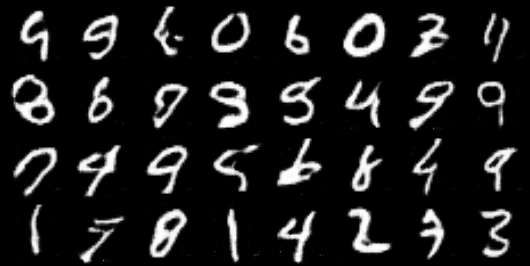


Fake celebrities after 5 epochs:

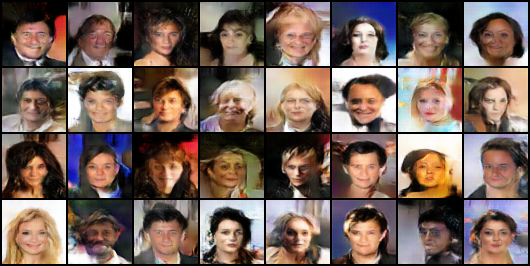

## Import libraries

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import multiprocessing

from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter

## Set and test the model

In [2]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            # Input: N x channels_img x 64 x64
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1),
            # N x features_d x 32 x 32
            nn.LeakyReLU(0.2),
            self._block(features_d,   features_d*2, kernel_size=4, stride=2, padding=1),
            # N x features_d*2 x 16 x 16
            self._block(features_d*2, features_d*4, kernel_size=4, stride=2, padding=1),
            # N x features_d*4 x 8 x 8
            self._block(features_d*4, features_d*8, kernel_size=4, stride=2, padding=1),
            # N x features_d*8 x 4 x 4
            nn.Conv2d(features_d*8, 1, kernel_size=4, stride=1, padding=0),
            # Output: N x 1 x 1 x 1 - False or True image?
            nn.Sigmoid(),  # between (0, 1)
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            # bias=False for BatchNorm
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, z_dim, channels_img, features_g):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            # Input: N x z_dim x 1 x 1
            self._block(z_dim,         features_g*16, kernel_size=4, stride=1, padding=0),
            # N x features_g*16 x 4 x 4
            self._block(features_g*16, features_g*8,  kernel_size=4, stride=2, padding=1),
            # N x features_g*8 x 8 x 8
            self._block(features_g*8,  features_g*4,  kernel_size=4, stride=2, padding=1),
            # N x features_g*4 x 16 x 16
            self._block(features_g*4,  features_g*2,  kernel_size=4, stride=2, padding=1),
            # N x features_g*2 x 32 x 32
            nn.ConvTranspose2d(features_g*2, channels_img, kernel_size=4, stride=2, padding=1),
            # Output: N x channels_img x 64 x 64
            nn.Tanh(),  # between (-1, 1)
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),  # like in DCGAN paper
        )

    def forward(self, x):
        return self.gen(x)


def init_weights(model):
    '''
        Initialize weights of the model
        with mean of 0.0 and standard deviation of 0.02
    '''
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


def test():
    N, in_channels, height, width = 8, 3, 64, 64
    z_dim = 100
    features_d = features_g = 64

    x = torch.randn((N, in_channels, height, width))
    disc = Discriminator(in_channels, features_d)
    init_weights(disc)
    assert disc(x).shape == (N, 1, 1, 1)

    gen = Generator(z_dim, in_channels, features_g)
    init_weights(gen)
    z = torch.randn((N, z_dim, 1, 1))
    assert gen(z).shape == (N, in_channels, height, width)

    print('Test is OK')

In [3]:
test()

Test is OK


## Prepare the model

In [4]:
# Hyperparameters
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
learning_rate = 2e-4
batch_size = 128
image_size = 64
channels_img = 1  # MNIST dataset
z_dim = 100
num_epochs = 5
features_d = features_g = 64

transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.5 for _ in range(channels_img)],
                         [0.5 for _ in range(channels_img)]),
])


def save_checkpoint(state, filename):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])
    step = checkpoint["step"]
    return step

In [5]:
# Get MNIST dataset

# For the error: HTTPError: HTTP Error 503: Service Unavailable
# Use this instead
data_dir = '/content/dataset/MNIST/raw/'
if os.path.exists(data_dir):
    !rm -rf {data_dir}

!mkdir {data_dir}
!wget --directory-prefix={data_dir} https://github.com/golbin/TensorFlow-MNIST/raw/master/mnist/data/t10k-images-idx3-ubyte.gz
!wget --directory-prefix={data_dir} https://github.com/golbin/TensorFlow-MNIST/raw/master/mnist/data/t10k-labels-idx1-ubyte.gz
!wget --directory-prefix={data_dir} https://github.com/golbin/TensorFlow-MNIST/raw/master/mnist/data/train-images-idx3-ubyte.gz
!wget --directory-prefix={data_dir} https://github.com/golbin/TensorFlow-MNIST/raw/master/mnist/data/train-labels-idx1-ubyte.gz

# For the error: HTTPError: HTTP Error 403: Forbidden
# StackOverflow: https://stackoverflow.com/a/66461122/7550928
from six.moves import urllib
opener = urllib.request.build_opener()
opener.addheaders = [('User-agent', 'Mozilla/5.0')]
urllib.request.install_opener(opener)

dataset = datasets.MNIST(root='dataset/', train=True, transform=transform, download=True)

mkdir: cannot create directory ‘/content/dataset/MNIST/raw/’: No such file or directory
--2025-07-30 15:40:26--  https://github.com/golbin/TensorFlow-MNIST/raw/master/mnist/data/t10k-images-idx3-ubyte.gz
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/golbin/TensorFlow-MNIST/master/mnist/data/t10k-images-idx3-ubyte.gz [following]
--2025-07-30 15:40:26--  https://raw.githubusercontent.com/golbin/TensorFlow-MNIST/master/mnist/data/t10k-images-idx3-ubyte.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1648877 (1.6M) [application/octet-stream]
Saving to: ‘/content/dataset/MNIST/raw/t10k-images-id

## Run TensorBoard

In [6]:
# Run TensorBoard

# Delete previous logs dir
logs_dir = 'logs_mnist'
if os.path.exists(logs_dir):
    !rm -rf {logs_dir}

# To fix the error, because PyTorch and TensorFlow are installed both:
# AttributeError: module 'tensorflow._api.v2.io.gfile' has no attribute 'get_filesystem'
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Start TensorBoard before training to monitor it in progress
%tensorboard --logdir {logs_dir}

# Reload TensorBoard
%reload_ext tensorboard

Output hidden; open in https://colab.research.google.com to view.

## Train the model

In [7]:
# Initialize generator and discriminator
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
gen = Generator(z_dim, channels_img, features_g).to(device)
disc = Discriminator(channels_img, features_d).to(device)
init_weights(gen)
init_weights(disc)

optim_gen = optim.Adam(gen.parameters(), lr=learning_rate, betas=(0.5, 0.999))
optim_disc = optim.Adam(disc.parameters(), lr=learning_rate, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, z_dim, 1, 1).to(device)

# Set writer for TensorBoard
writer_real = SummaryWriter(os.path.join(logs_dir, 'real'))
writer_fake = SummaryWriter(os.path.join(logs_dir, 'fake'))
step = 0

# Load models
gen_checkpoint_name = 'dcgan_generator_checkpoint.pth.tar'
disc_checkpoint_name = 'dcgan_discriminator_checkpoint.pth.tar'

if os.path.exists(gen_checkpoint_name) and os.path.exists(disc_checkpoint_name):
    step = load_checkpoint(torch.load(gen_checkpoint_name), gen, optim_gen)
    step = load_checkpoint(torch.load(disc_checkpoint_name), disc, optim_disc)


def train(step=step):
    gen.train()  # set the training mode
    disc.train()

    for epoch in range(num_epochs):
        for batch_idx, (real, _) in enumerate(loader):
            real = real.to(device)
            noise = torch.randn((batch_size, z_dim, 1, 1)).to(device)
            fake = gen(noise)

            # train Discriminator: max log(D(real)) + log(1-D(G(noise)))
            disc_real = disc(real).reshape(-1)  # convert (N,1,1,1) to (N)
            disc_fake = disc(fake).reshape(-1)
            loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
            loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
            loss_disc = (loss_disc_real + loss_disc_fake) / 2.0

            optim_disc.zero_grad()
            loss_disc.backward(retain_graph=True)
            optim_disc.step()

            # train Generator: min log(1-D(G(noise))) or max log(D(G(noise)))
            disc_fake = disc(fake).reshape(-1)
            loss_gen = criterion(disc_fake, torch.ones_like(disc_fake))

            optim_gen.zero_grad()
            loss_gen.backward()
            optim_gen.step()

            if batch_idx % 100 == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}] '
                      f'Batch {batch_idx}/{len(loader)} '
                      f'Loss D {loss_disc:.4f}, '
                      f'Loss G {loss_gen:.4f}')

                with torch.no_grad():
                    fake = gen(fixed_noise)
                    # take out up to 32 examples
                    img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
                    img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                    writer_fake.add_image('Fake', img_grid_fake, global_step=step)
                    writer_real.add_image('Real', img_grid_real, global_step=step)
                    step += 1

        # Save models
        gen_checkpoint = {
            'state_dict': gen.state_dict(),
            'optimizer': optim_gen.state_dict(),
            'step': step,
        }
        disc_checkpoint = {
            'state_dict': disc.state_dict(),
            'optimizer': optim_disc.state_dict(),
            'step': step,
        }
        save_checkpoint(gen_checkpoint, gen_checkpoint_name)
        save_checkpoint(disc_checkpoint, disc_checkpoint_name)

In [8]:
train(step=step)

Epoch [1/5] Batch 0/469 Loss D 0.6949, Loss G 0.7713
Epoch [1/5] Batch 100/469 Loss D 0.0148, Loss G 4.1229
Epoch [1/5] Batch 200/469 Loss D 0.6495, Loss G 0.8722
Epoch [1/5] Batch 300/469 Loss D 0.7248, Loss G 2.7194
Epoch [1/5] Batch 400/469 Loss D 0.5328, Loss G 1.0450
=> Saving checkpoint
=> Saving checkpoint
Epoch [2/5] Batch 0/469 Loss D 0.6087, Loss G 1.4601
Epoch [2/5] Batch 100/469 Loss D 0.6486, Loss G 0.7837
Epoch [2/5] Batch 200/469 Loss D 0.6697, Loss G 0.5714
Epoch [2/5] Batch 300/469 Loss D 0.6514, Loss G 1.9072
Epoch [2/5] Batch 400/469 Loss D 0.6299, Loss G 0.8364
=> Saving checkpoint
=> Saving checkpoint
Epoch [3/5] Batch 0/469 Loss D 0.5797, Loss G 0.9336
Epoch [3/5] Batch 100/469 Loss D 0.5737, Loss G 0.9582
Epoch [3/5] Batch 200/469 Loss D 0.5919, Loss G 1.1015
Epoch [3/5] Batch 300/469 Loss D 0.5837, Loss G 0.9255
Epoch [3/5] Batch 400/469 Loss D 0.5792, Loss G 1.1210
=> Saving checkpoint
=> Saving checkpoint
Epoch [4/5] Batch 0/469 Loss D 0.5040, Loss G 1.8071
Ep

## Train celebrity CelebA dataset

**NOTE:** To download dataset from [Kaggle](https://www.kaggle.com/) you should copy `kaggle.json` file with API key to Colab.

See how to obtain a [Kaggle API Key here](https://christianjmills.com/posts/kaggle-obtain-api-key-tutorial/).

In [9]:
# Get dataset from Kaggle

# Colab's file access feature
from google.colab import files

# Upload `kaggle.json` file
uploaded = files.upload()

# Retrieve uploaded file and print results
for fn in uploaded.keys():
  print(f'User uploaded file "{fn}" with length {len(uploaded[fn])} bytes')

# Then copy kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!ls ~/.kaggle

# Download the dataset
# !kaggle datasets list -s celeba
!kaggle datasets download -d jessicali9530/celeba-dataset

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 65 bytes
kaggle.json
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 99% 1.31G/1.33G [00:10<00:00, 39.6MB/s]
100% 1.33G/1.33G [00:10<00:00, 131MB/s] 


In [10]:
# Unzip
import zipfile

with zipfile.ZipFile('celeba-dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('.')

In [11]:
image_folder = './img_align_celeba/img_align_celeba'
img_name = {}

for idx, name in enumerate(os.listdir(image_folder)):
    img_name[idx] = name

print('length:', len(img_name))
print('shape:', Image.open(os.path.join(image_folder, img_name[55])).size)

for i in range(5):
    print(img_name[i])

length: 202599
shape: (178, 218)
125568.jpg
003598.jpg
066166.jpg
032748.jpg
009625.jpg


In [12]:
class MyDataset(Dataset):
    def __init__(self, root, transform):
        self.root = root
        self.transform = transform

        self.img_name = {}
        for idx, name in enumerate(os.listdir(self.root)):
            self.img_name[idx] = name

    def __len__(self):
        return len(self.img_name)  # 202 599 images

    def __getitem__(self, index):
        filepath = os.path.join(self.root, self.img_name[index])
        image = Image.open(filepath)
        image = self.transform(image)
        return image


image_folder = './img_align_celeba/img_align_celeba'
IMAGE_SIZE = 64

transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])

dataset = MyDataset(root=image_folder, transform=transform)
print(dataset.__len__())
print(dataset.__getitem__(55).shape)
# print(dataset.__getitem__(55))


def save_checkpoint(state, filename):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])
    step = checkpoint["step"]
    return step

202599
torch.Size([3, 64, 64])


In [13]:
# Run the second TensorBoard for celebrities

# Delete previous logs dir
logs_dir = 'logs_celeb'
if os.path.exists(logs_dir):
    !rm -rf {logs_dir}

# To fix the error, because PyTorch and TensorFlow are installed both:
# AttributeError: module 'tensorflow._api.v2.io.gfile' has no attribute 'get_filesystem'
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Start TensorBoard before training to monitor it in progress
%tensorboard --logdir {logs_dir}

# Reload TensorBoard
%reload_ext tensorboard

Output hidden; open in https://colab.research.google.com to view.

In [14]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(  # Input: N x 3 x 64 x64
            self._block(channels_img, features_d,   kernel_size=4, stride=2, padding=1),  # N x 64 x 32 x 32
            self._block(features_d,   features_d*2, kernel_size=4, stride=2, padding=1),  # N x 128 x 16 x 16
            self._block(features_d*2, features_d*4, kernel_size=4, stride=2, padding=1),  # N x 256 x 8 x 8
            self._block(features_d*4, features_d*8, kernel_size=4, stride=2, padding=1),  # N x 512 x 4 x 4
            nn.Conv2d(features_d*8, 1, kernel_size=4, stride=1, padding=0),
            # Output: N x 1 x 1 x 1 - False or True image?
            nn.Flatten(),
            nn.Sigmoid(),  # between (0, 1)
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            # bias=False for BatchNorm
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, z_dim, channels_img, features_g):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(  # Input: N x z_dim x 1 x 1
            self._block(z_dim,        features_g*8, kernel_size=4, stride=1, padding=0),  # N x 512 x 4 x 4
            self._block(features_g*8, features_g*4, kernel_size=4, stride=2, padding=1),  # N x 256 x 8 x 8
            self._block(features_g*4, features_g*2, kernel_size=4, stride=2, padding=1),  # N x 128 x 16 x 16
            self._block(features_g*2, features_g,   kernel_size=4, stride=2, padding=1),  # N x 64 x 32 x 32
            nn.ConvTranspose2d(features_g, channels_img, kernel_size=4, stride=2, padding=1),
            # Output: N x 3 x 64 x 64
            nn.Tanh(),  # between (-1, 1)
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),  # like in DCGAN paper
        )

    def forward(self, x):
        return self.gen(x)


def init_weights(model):
    ''' Initialize weights of the model
        with mean of 0.0 and standard deviation of 0.02 '''
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


def test():
    N, in_channels, height, width = 8, 3, 64, 64
    z_dim = 100
    features_d = features_g = 64

    x = torch.randn((N, in_channels, height, width))
    disc = Discriminator(in_channels, features_d)
    init_weights(disc)
    assert disc(x).shape == (N, 1)

    gen = Generator(z_dim, in_channels, features_g)
    init_weights(gen)
    z = torch.randn((N, z_dim, 1, 1))
    assert gen(z).shape == (N, in_channels, height, width)

    print('Test is OK')

test()

# Hyperparameters etc.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4  # could also use two lrs, one for gen and one for disc
BATCH_SIZE = 128
CHANNELS_IMG = 3
NOISE_DIM = 100
NUM_EPOCHS = 5
FEATURES_DISC = 64
FEATURES_GEN = 64

loader = DataLoader(dataset=dataset, batch_size=BATCH_SIZE, shuffle=True,
                    num_workers=multiprocessing.cpu_count(), pin_memory=True)

gen = Generator(NOISE_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)
init_weights(gen)
init_weights(disc)

opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, NOISE_DIM, 1, 1).to(device)
writer_real = SummaryWriter(os.path.join(logs_dir, "real"))
writer_fake = SummaryWriter(os.path.join(logs_dir, "fake"))
step = 0

# Load models
gen_checkpoint_name = 'dcgan_generator_celeb.pth.tar'
disc_checkpoint_name = 'dcgan_discriminator_celeb.pth.tar'

if os.path.exists(gen_checkpoint_name) and os.path.exists(disc_checkpoint_name):
    step = load_checkpoint(torch.load(gen_checkpoint_name), gen, optim_gen)
    step = load_checkpoint(torch.load(disc_checkpoint_name), disc, optim_disc)

gen.train()
disc.train()

for epoch in range(NUM_EPOCHS):
    # Target labels not needed! <3 unsupervised
    for batch_idx, real in enumerate(loader):
        real = real.to(device)
        noise = torch.randn(BATCH_SIZE, NOISE_DIM, 1, 1).to(device)
        fake = gen(noise)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach())
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))

        loss_disc = loss_disc_real + loss_disc_fake

        opt_disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake)
        loss_gen = criterion(output, torch.ones_like(output))

        opt_gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Print losses occasionally and print to tensorboard
        if batch_idx % 100 == 0:
            print(f"Epoch [{epoch+1}/{NUM_EPOCHS}] "
                  f"Batch {batch_idx}/{len(loader)} "
                  f"Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}")

            with torch.no_grad():
                fake = gen(fixed_noise)
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(
                    real[:32], normalize=True
                )
                img_grid_fake = torchvision.utils.make_grid(
                    fake[:32], normalize=True
                )

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1

    # Save models
    gen_checkpoint = {
        'state_dict': gen.state_dict(),
        'optimizer': opt_gen.state_dict(),
        'step': step,
    }
    disc_checkpoint = {
        'state_dict': disc.state_dict(),
        'optimizer': opt_disc.state_dict(),
        'step': step,
    }
    save_checkpoint(gen_checkpoint, gen_checkpoint_name)
    save_checkpoint(disc_checkpoint, disc_checkpoint_name)

Test is OK
Epoch [1/5] Batch 0/1583 Loss D: 1.3923, loss G: 0.7836
Epoch [1/5] Batch 100/1583 Loss D: 0.0439, loss G: 4.1413
Epoch [1/5] Batch 200/1583 Loss D: 0.6263, loss G: 2.6845
Epoch [1/5] Batch 300/1583 Loss D: 0.5735, loss G: 1.9467
Epoch [1/5] Batch 400/1583 Loss D: 0.8633, loss G: 1.9054
Epoch [1/5] Batch 500/1583 Loss D: 0.7767, loss G: 2.2228
Epoch [1/5] Batch 600/1583 Loss D: 0.9029, loss G: 2.0917
Epoch [1/5] Batch 700/1583 Loss D: 0.7396, loss G: 1.8734
Epoch [1/5] Batch 800/1583 Loss D: 0.6678, loss G: 1.9603
Epoch [1/5] Batch 900/1583 Loss D: 0.8803, loss G: 1.7489
Epoch [1/5] Batch 1000/1583 Loss D: 1.0790, loss G: 3.3947
Epoch [1/5] Batch 1100/1583 Loss D: 0.8324, loss G: 1.9936
Epoch [1/5] Batch 1200/1583 Loss D: 0.6760, loss G: 2.0473
Epoch [1/5] Batch 1300/1583 Loss D: 0.6773, loss G: 2.3032
Epoch [1/5] Batch 1400/1583 Loss D: 0.7921, loss G: 2.0728
Epoch [1/5] Batch 1500/1583 Loss D: 0.7471, loss G: 1.4412
=> Saving checkpoint
=> Saving checkpoint
Epoch [2/5] Bat

In [15]:
# Mount Google Drive to Google Colab notebook
from google.colab import drive
dir_drive = '/content/gdrive'
drive.mount(dir_drive)

Mounted at /content/gdrive


In [17]:
# Path to my Google Drive directory
directory_name = f'"{dir_drive}/MyDrive/Colab Notebooks/2025.07.25_execises/models"'

!ls -hal {directory_name}  # check directory exists

!cp dcgan_generator_checkpoint.pth.tar     {directory_name}
!cp dcgan_discriminator_checkpoint.pth.tar {directory_name}
!cp dcgan_generator_celeb.pth.tar          {directory_name}
!cp dcgan_discriminator_celeb.pth.tar      {directory_name}

total 269M
-rw------- 1 root root  16M Jul 28 11:26 3d_image_classification.keras
-rw------- 1 root root  32M Jul 29 11:41 dcgan_discriminator_celeb.pth.tar
-rw------- 1 root root  32M Jul 29 11:41 dcgan_discriminator_checkpoint.pth.tar
-rw------- 1 root root  41M Jul 29 11:46 dcgan_generator_celeb.pth.tar
-rw------- 1 root root 145M Jul 29 12:10 dcgan_generator_checkpoint.pth.tar
-rw------- 1 root root 1.2M Jul 29 08:44 simple_gan_discriminator_checkpoint.pth.tar
-rw------- 1 root root 2.6M Jul 29 08:44 simple_gan_generator_checkpoint.pth.tar
